In [2]:
import numpy as np
from numpy import genfromtxt
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from matplotlib.pyplot import grid

In [3]:
#import git
!git clone https://github.com/KunaCornejo/RainAttenuationPrediction.git

fatal: destination path 'RainAttenuationPrediction' already exists and is not an empty directory.


In [4]:
ls 'RainAttenuationPrediction'

Arain.m                      itur_p1853_0_annex1_s2.m  Matriz_Train_70.csv.zip
c_n_ul.csv                   ITU_RP618_12.m            Matriz_Train_90.csv.zip
elazr.m                      ITU_RP838.m               RainAttenuation.ipynb
h0.txt                       Lat.txt                   README.md
itur_p0837_7_annex1.m        Lon.txt
_ITU-R_P0837-7_R001_map.mat  Matriz_Arain.csv.zip


In [5]:
#Unzip the .csv file
import zipfile #import ZipFile
with zipfile.ZipFile('/content/RainAttenuationPrediction/Matriz_Arain.csv.zip','r') as zip_ref:
    zip_ref.extractall('content')
with zipfile.ZipFile('/content/RainAttenuationPrediction/Matriz_Train_70.csv.zip','r') as zip_ref:
    zip_ref.extractall('content')
with zipfile.ZipFile('/content/RainAttenuationPrediction/Matriz_Train_90.csv.zip','r') as zip_ref:
    zip_ref.extractall('content')

In [4]:
Matrix_Arain = genfromtxt('content/Matriz_Arain.csv', delimiter=',') #Matrix_Arain.csv contains the rain attenuation time series obtained from ITU-R P1853-1 by each site
Matrix_Arain=np.transpose(Matrix_Arain)
Matrix_90 = genfromtxt('content/Matriz_Train_90.csv', delimiter=',')
Matrix_70 = genfromtxt('content/Matriz_Train_70.csv', delimiter=',')
print('done')

done


In [5]:
print(Matrix_Arain.shape)
print(Matrix_90.shape)
print(Matrix_70.shape)

(25, 525601)
(25, 525600)
(25, 525600)


In [6]:
c_n_ul = genfromtxt('/content/RainAttenuationPrediction/c_n_ul.csv', delimiter=',') 
c_n_ul=list(c_n_ul)
locations=['Panama','San Jose','Tegucigalpa','Mexico City','Monterrey','Guadalajara'\
             ,'Tijuana','La Habana','Sto. Domingo','San Salvador','San Juan',\
             'Torreon','La Paz, B.C.','Veracruz','Cancun','Chihuahua','Queretaro'\
             ,'Tuxtla, Gtz.','Cd. Juarez','San Pedro Sula','Belmopan','Kingston'\
             ,'Merida','Pto. Cabezas','Oaxaca']
locations=np.transpose([locations])
C_N_UL=np.array([c_n_ul],dtype=object) 
C_N_UL=np.transpose(C_N_UL)
CN_UP=np.concatenate((locations,C_N_UL),axis=1)
print(CN_UP)

[['Panama' 32.4401636]
 ['San Jose' 32.4611016]
 ['Tegucigalpa' 32.4450513]
 ['Mexico City' 32.3918091]
 ['Monterrey' 32.313151]
 ['Guadalajara' 32.3588726]
 ['Tijuana' 32.0981607]
 ['La Habana' 32.3380601]
 ['Sto. Domingo' 32.2887155]
 ['San Salvador' 32.4521009]
 ['San Juan' 32.2438352]
 ['Torreon' 32.301041]
 ['La Paz, B.C.' 32.2705558]
 ['Veracruz' 32.4018877]
 ['Cancun' 32.3779865]
 ['Chihuahua' 32.2435489]
 ['Queretaro' 32.3736176]
 ['Tuxtla, Gtz.' 32.4294244]
 ['Cd. Juarez' 32.195777]
 ['San Pedro Sula' 32.4354086]
 ['Belmopan' 32.4215586]
 ['Kingston' 32.3572017]
 ['Merida' 32.3851709]
 ['Pto. Cabezas' 32.4314209]
 ['Oaxaca' 32.4205395]]


['Panama']


findfont: Font family ['Times'] not found. Falling back to DejaVu Sans.


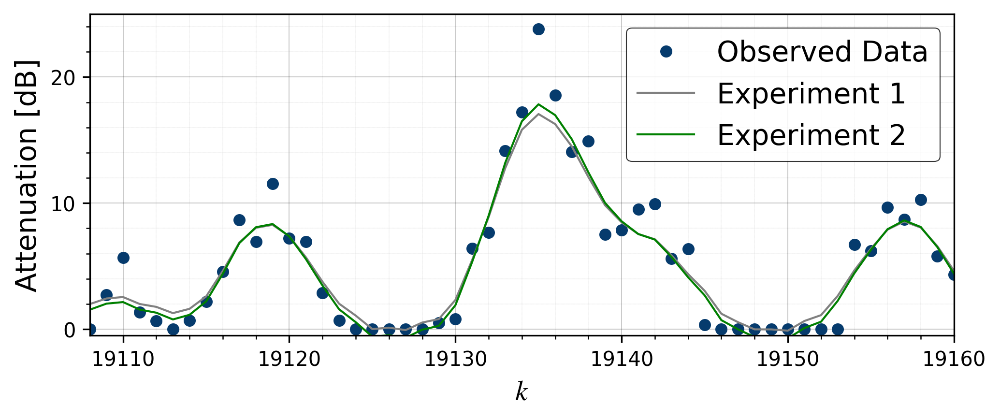

In [7]:
#Trained Dataset Total Graphics
index=0
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=19110
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

findfont: Font family ['stix'] not found. Falling back to DejaVu Sans.


['San Jose']


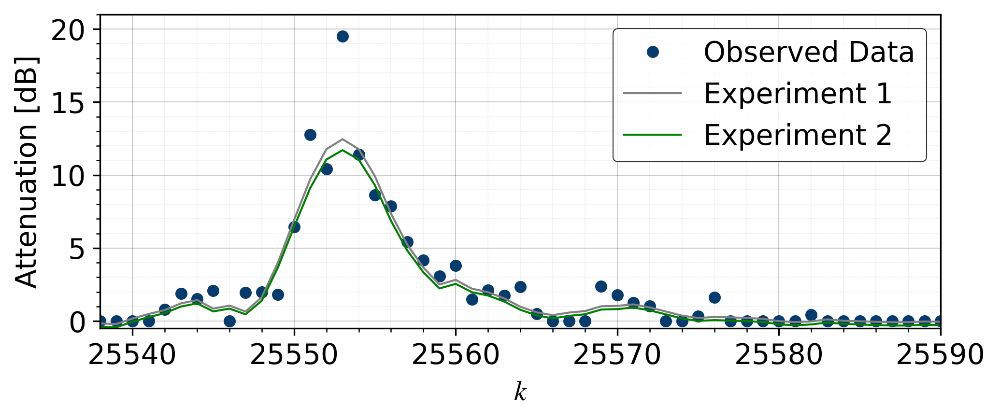

In [8]:
#Trained Dataset Total Graphics
index=1
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=25540
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Tegucigalpa']


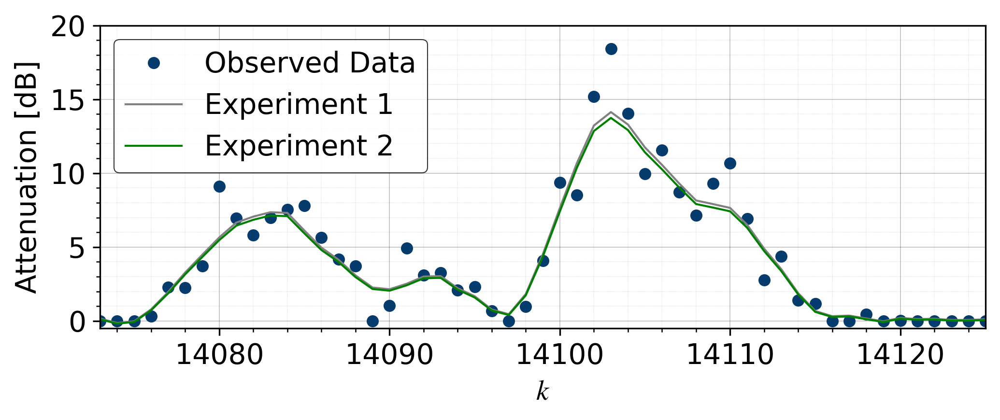

In [9]:
#Trained Dataset Total Graphics
index=2
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=14075
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Mexico City']


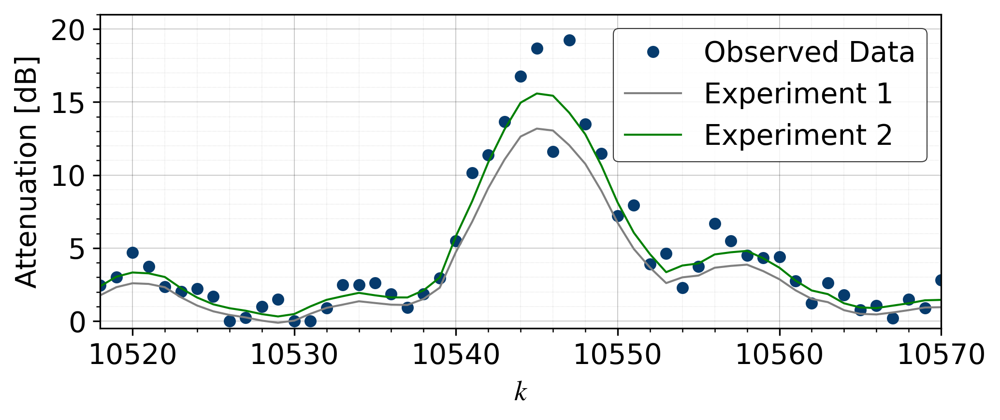

In [10]:
#Trained Dataset Total Graphics
index=3
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=10520
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Monterrey']


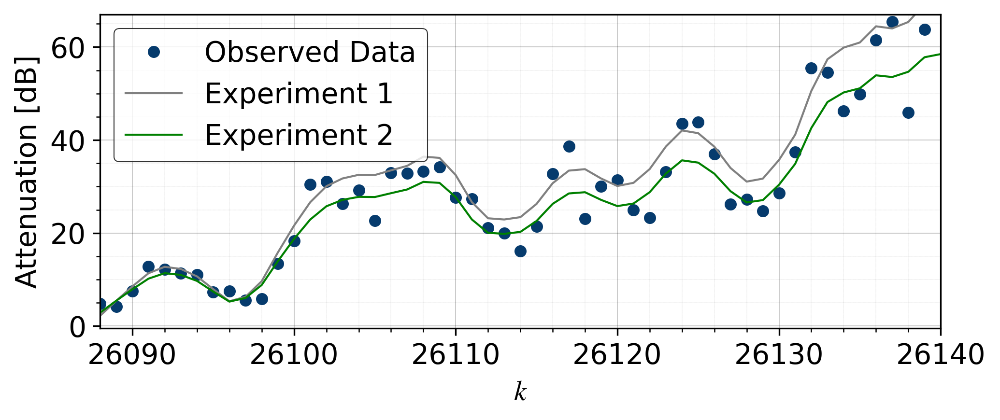

In [11]:
#Trained Dataset Total Graphics
index=4
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=26090
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Guadalajara']


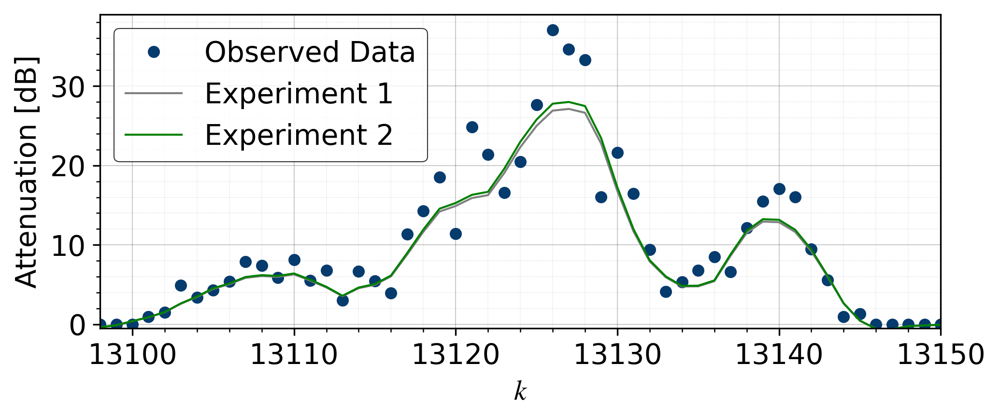

In [12]:
#Trained Dataset Total Graphics
index=5
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=13100
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Tijuana']


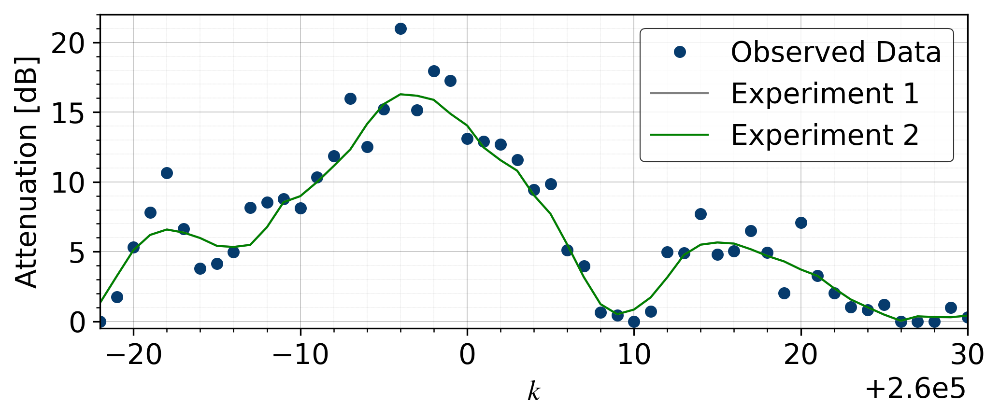

In [13]:
#Trained Dataset Total Graphics
index=6
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=259980
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['La Habana']


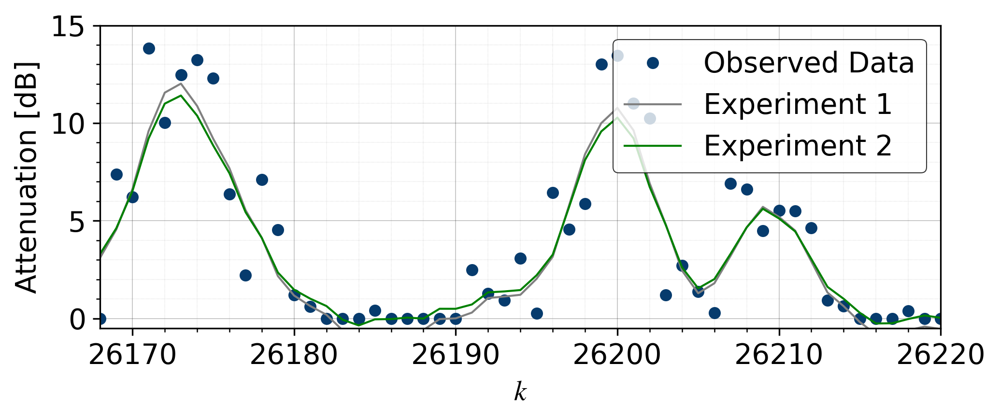

In [14]:
#Trained Dataset Total Graphics
index=7
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=26170
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Sto. Domingo']


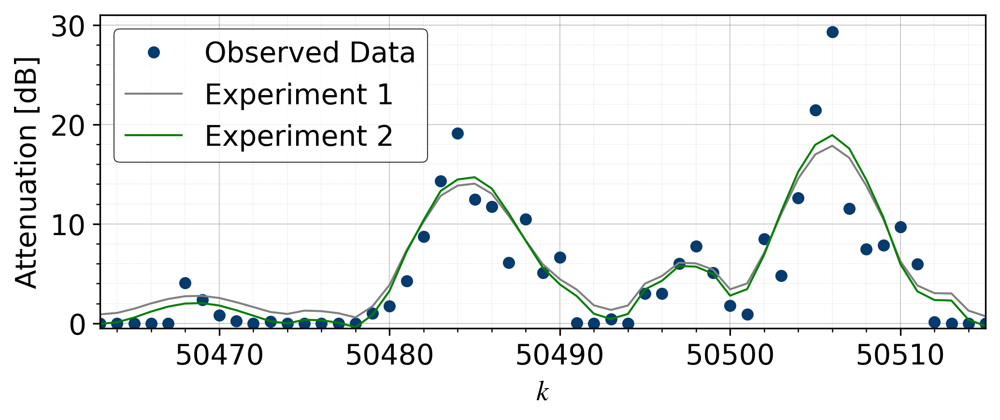

In [15]:
#Trained Dataset Total Graphics
index=8
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=50465
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['San Salvador']


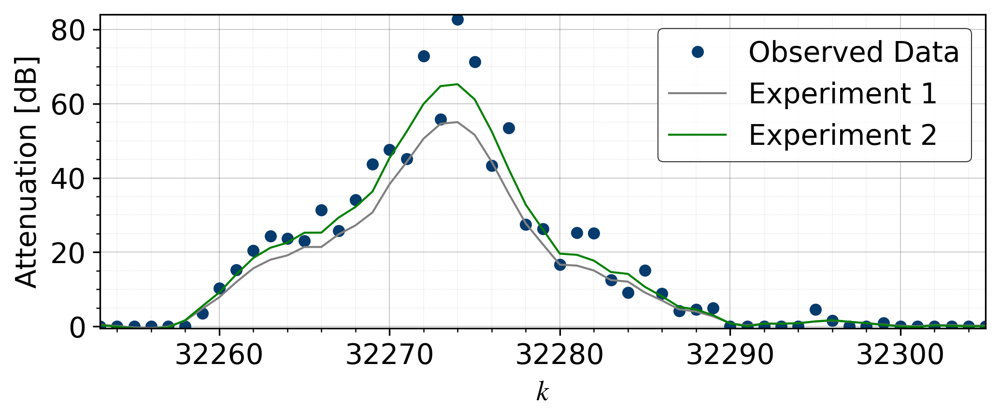

In [16]:
#Trained Dataset Total Graphics
index=9
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=32255
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['San Juan']


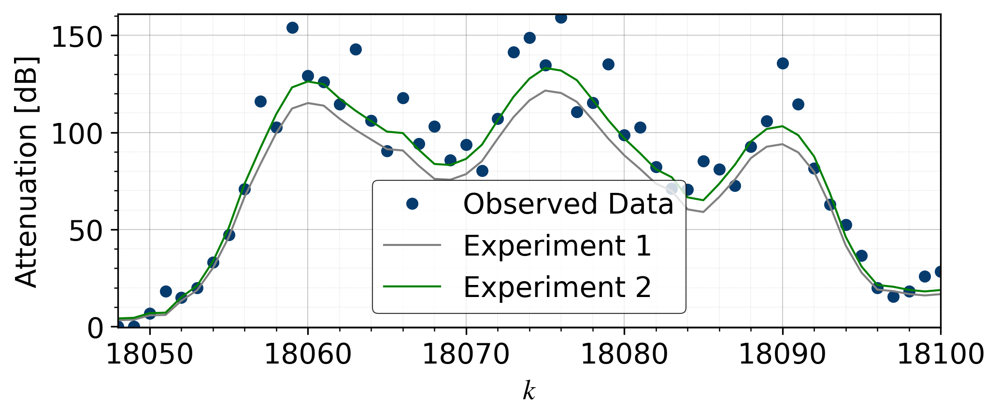

In [17]:
#Trained Dataset Total Graphics
index=10
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=18050
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Torreon']


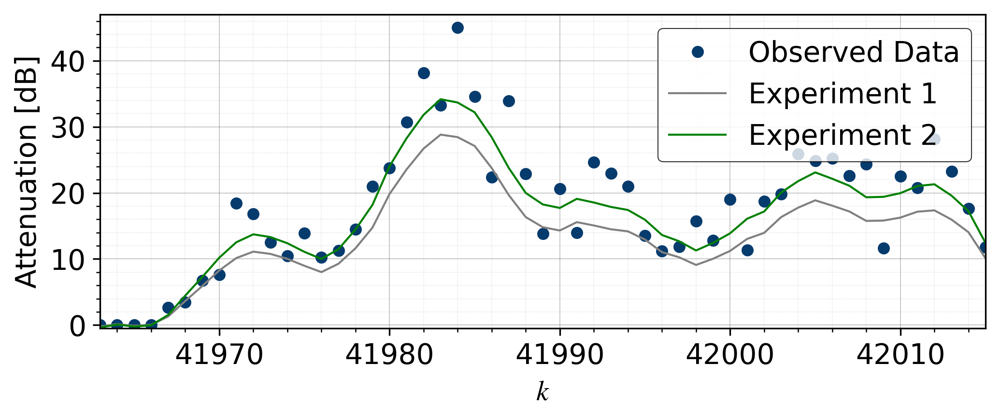

In [18]:
#Trained Dataset Total Graphics
index=11
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=41965
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['La Paz, B.C.']


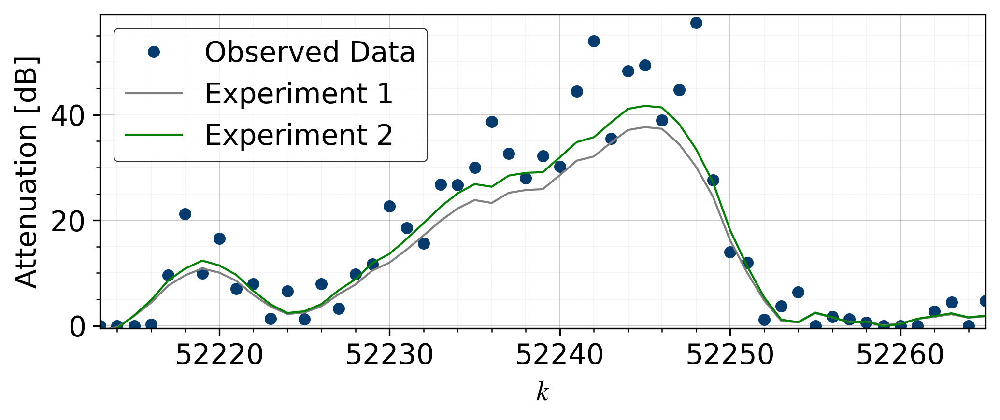

In [19]:
#Trained Dataset Total Graphics
index=12
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=52215
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Veracruz']


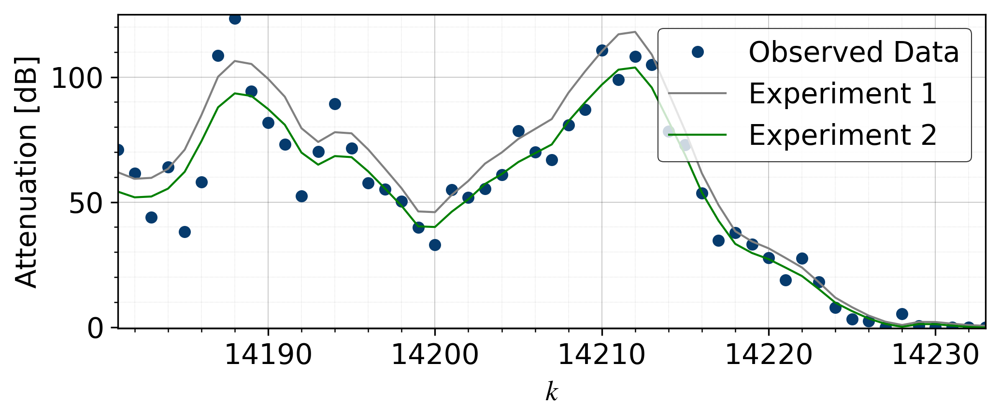

In [20]:
#Trained Dataset Total Graphics
index=13
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=14183
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Cancun']


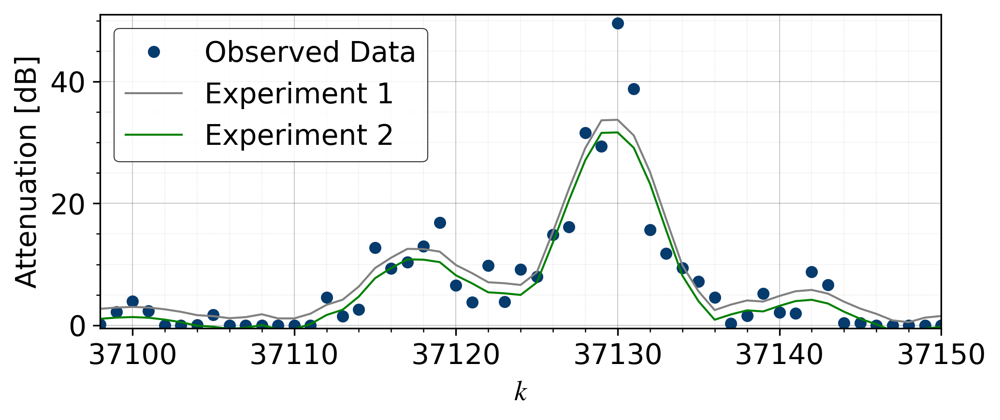

In [21]:
#Trained Dataset Total Graphics
index=14
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=37100
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Queretaro']


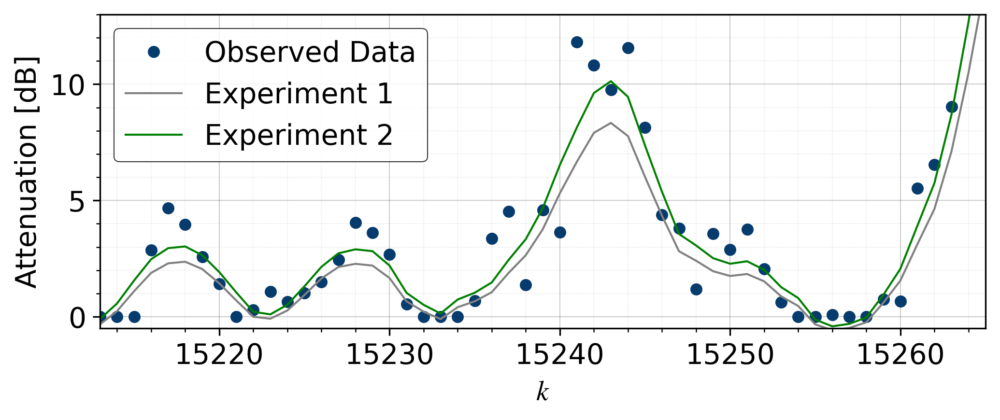

In [22]:
#Trained Dataset Total Graphics
index=16
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=15215
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Tuxtla, Gtz.']


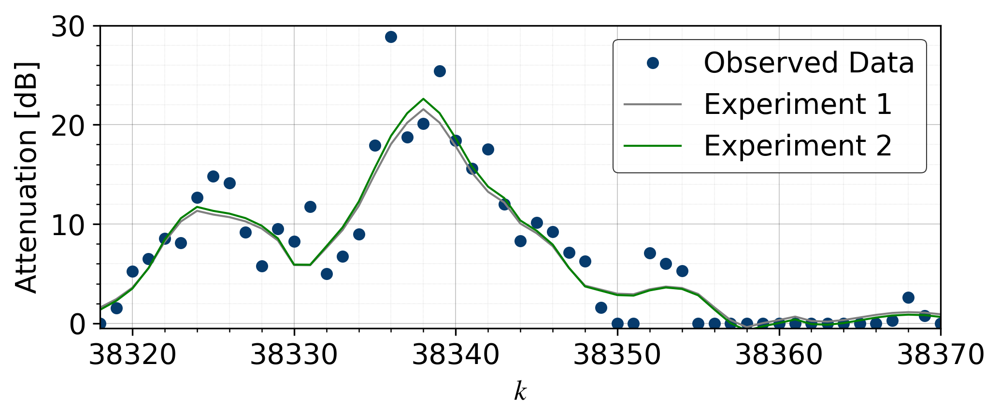

In [23]:
#Trained Dataset Total Graphics
index=17
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=38320
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Cd. Juarez']


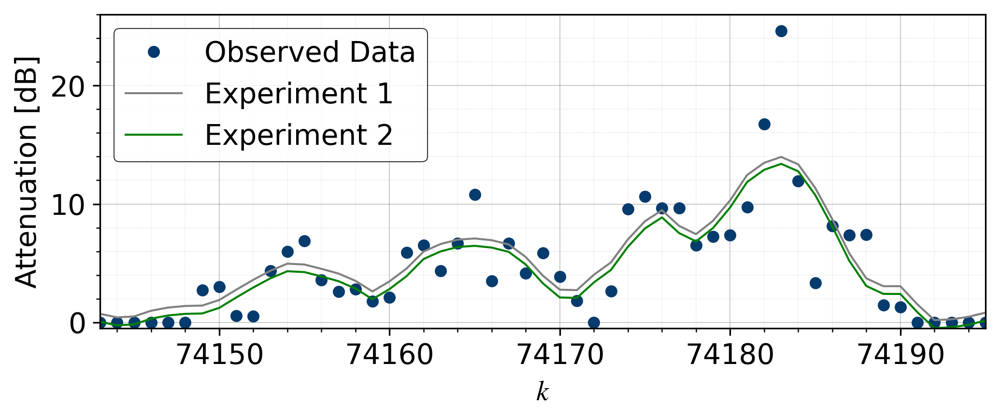

In [24]:
#Trained Dataset Total Graphics
index=18
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=74145
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['San Pedro Sula']


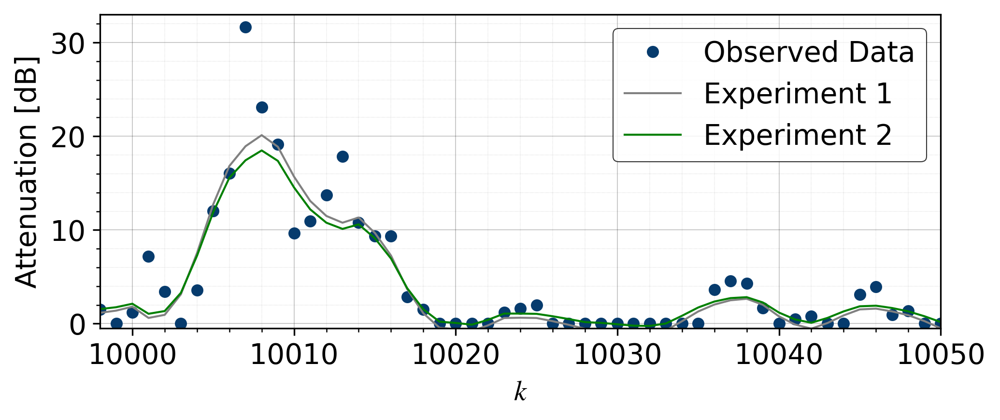

In [25]:
#Trained Dataset Total Graphics
index=19
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=10000
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Belmopan']


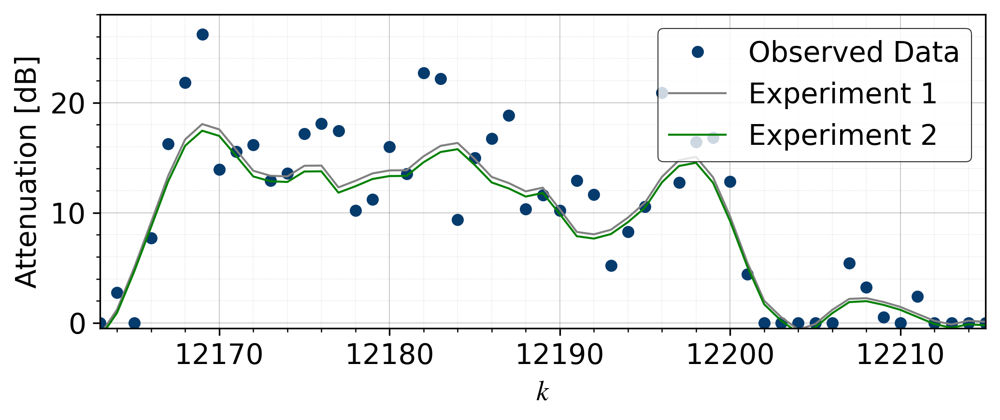

In [26]:
#Trained Dataset Total Graphics
index=20
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=12165
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Kingston']


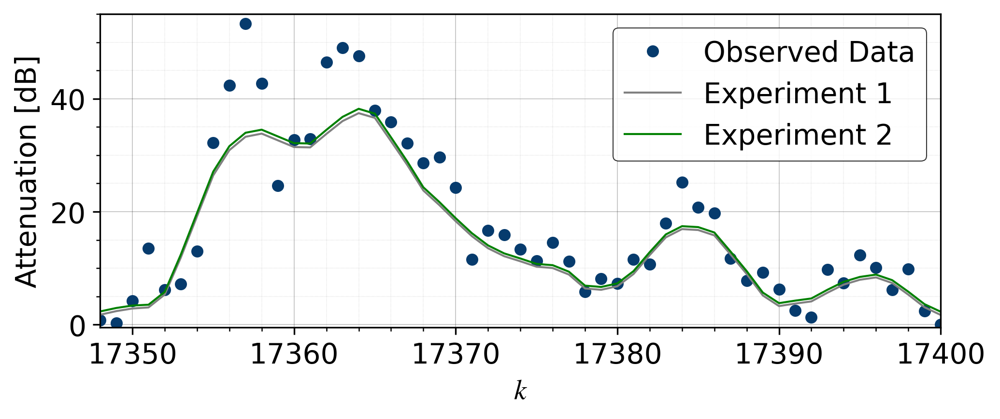

In [27]:
#Trained Dataset Total Graphics
index=21
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=17350
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Merida']


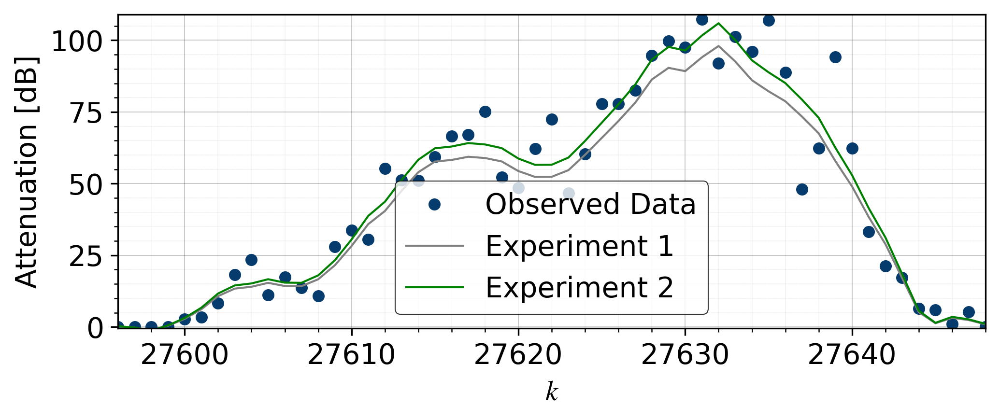

In [28]:
#Trained Dataset Total Graphics
index=22
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=27598
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Pto. Cabezas']


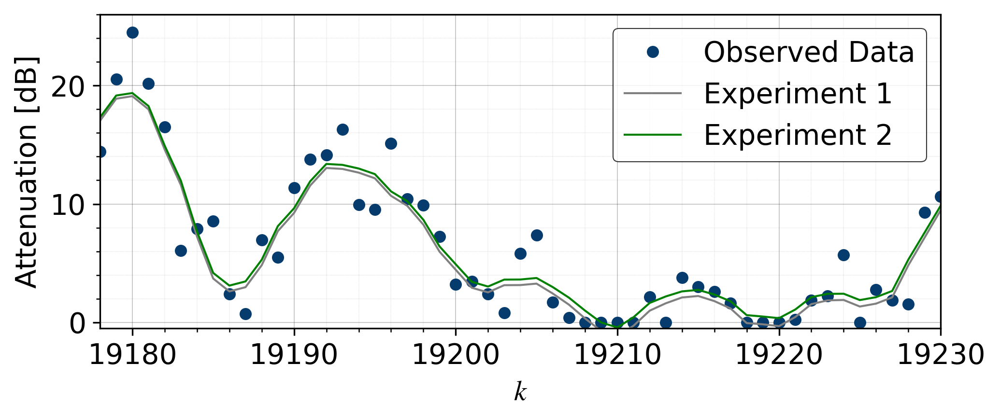

In [29]:
#Trained Dataset Total Graphics
index=23
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=19180
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Oaxaca']


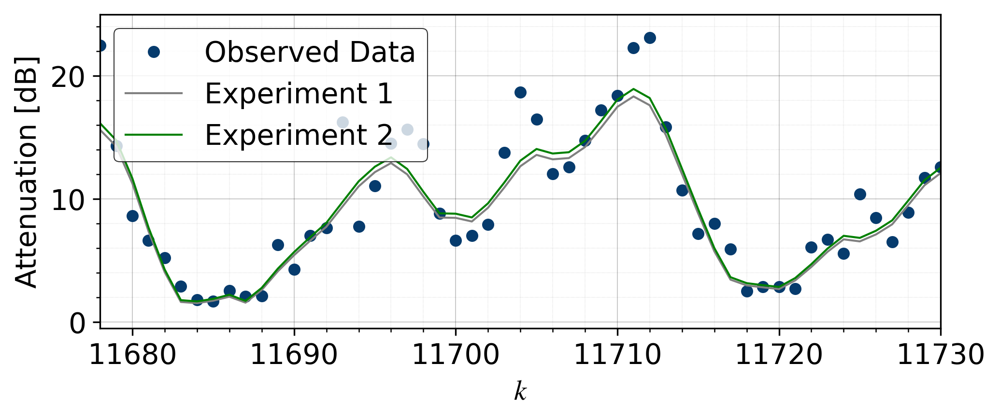

In [30]:
#Trained Dataset Total Graphics
index=24
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

a=11680
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='#063b6d',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',color='grey',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',color='g',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Panama']


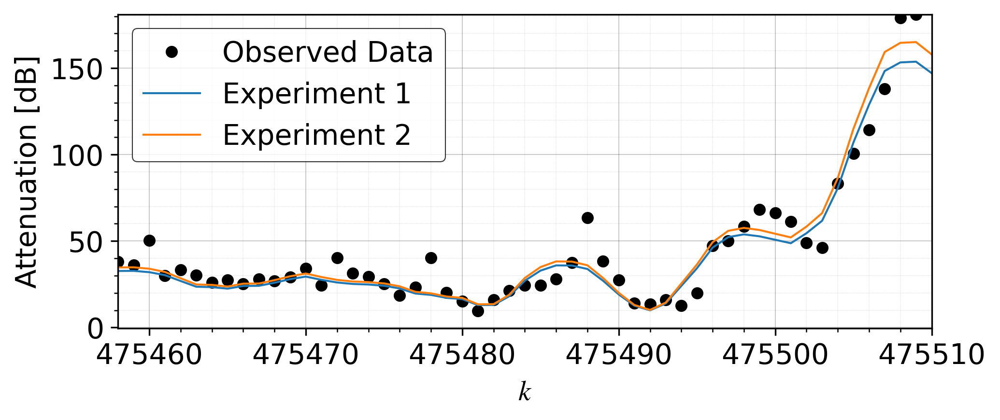

In [31]:
#Validated Dataset Total Graphics
index=0
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+2420
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['San Jose']


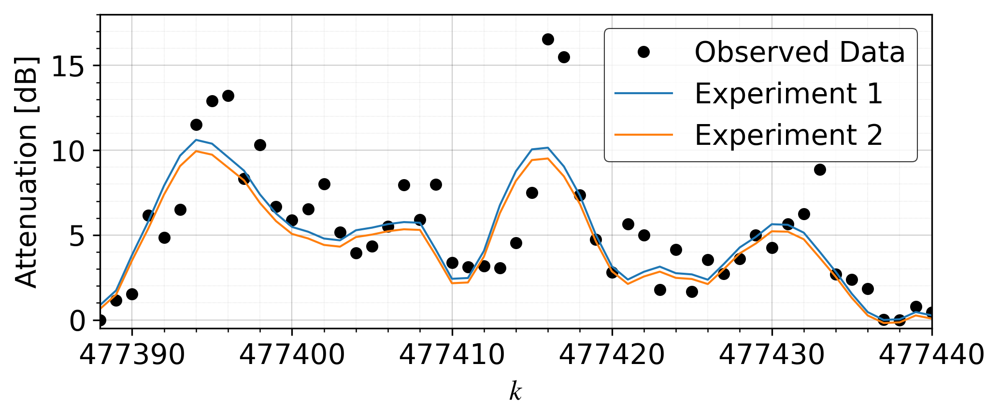

In [32]:
#Validated Dataset Total Graphics
index=1
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+4350
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Tegucigalpa']


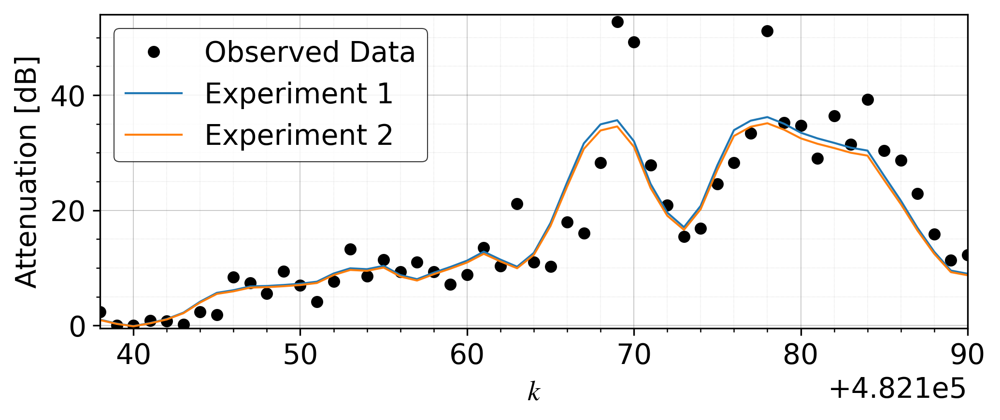

In [33]:
#Validated Dataset Total Graphics
index=2
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+9100
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Mexico City']


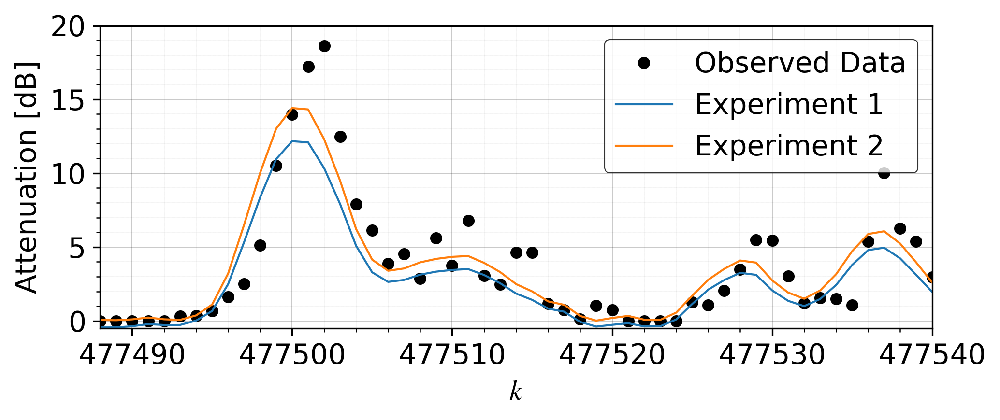

In [34]:
#Validated Dataset Total Graphics
index=3
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+4450
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Monterrey']


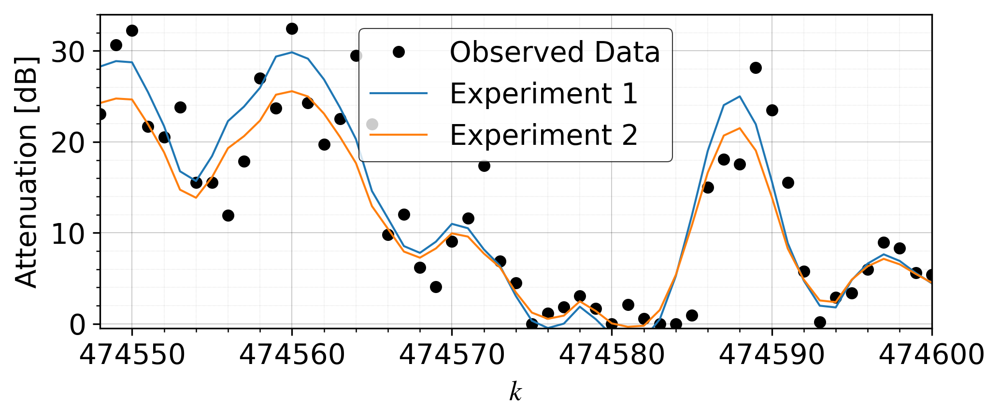

In [35]:
#Validated Dataset Total Graphics
index=4
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+1510
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Guadalajara']


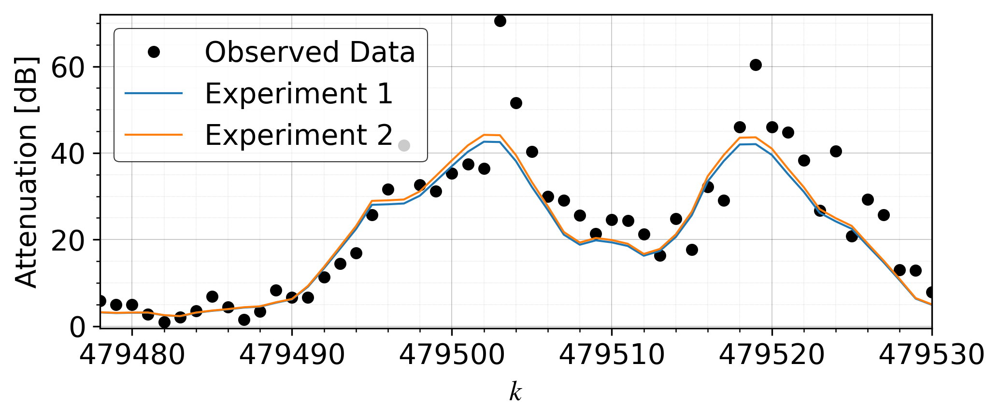

In [36]:
#Validated Dataset Total Graphics
index=5
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+6440
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Tijuana']


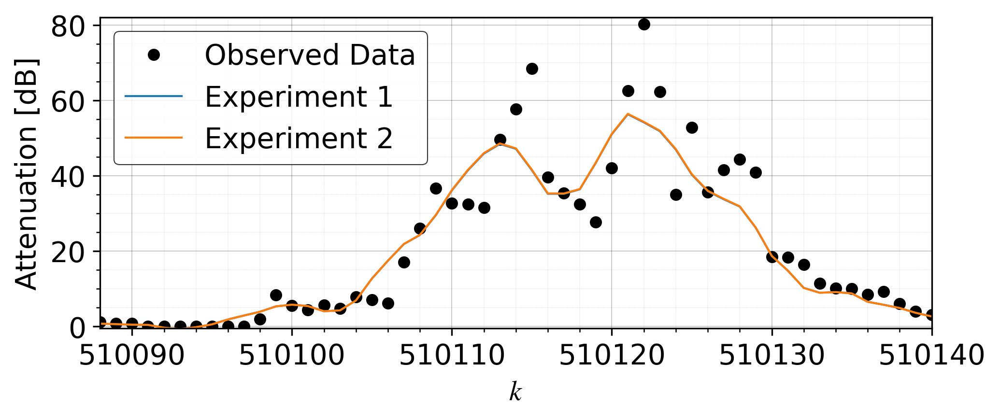

In [37]:
#Validated Dataset Total Graphics
index=6
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+37050
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['La Habana']


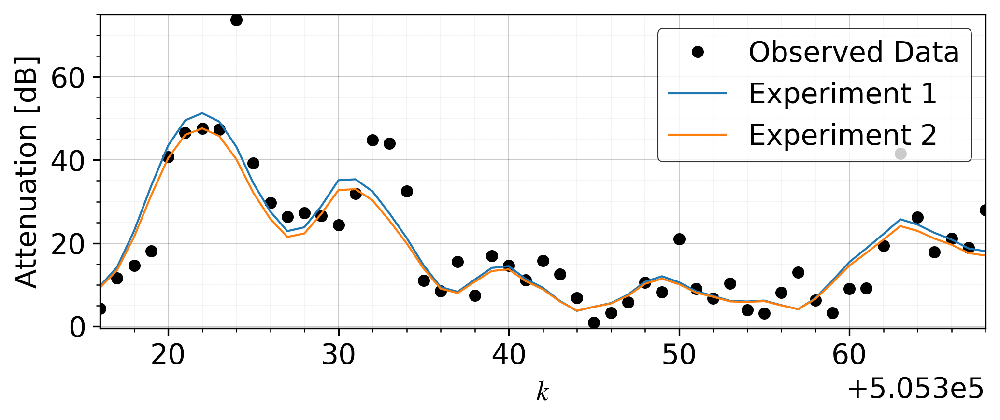

In [38]:
#Validated Dataset Total Graphics
index=7
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+32278
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Sto. Domingo']


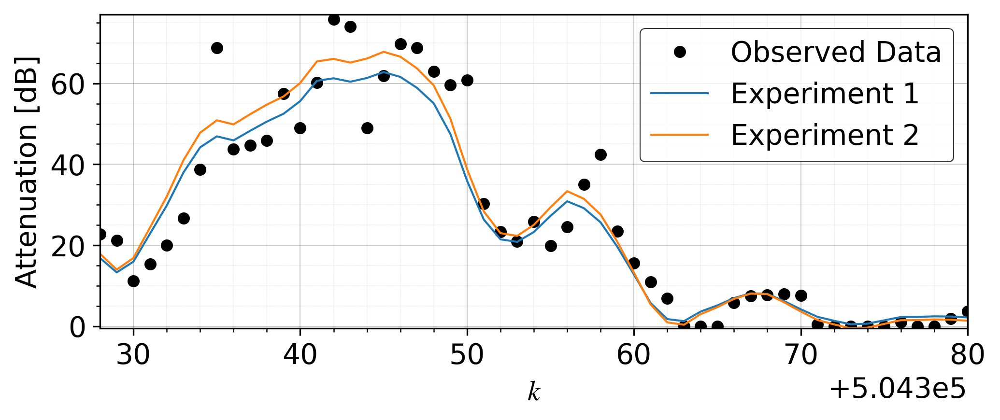

In [39]:
#Validated Dataset Total Graphics
index=8
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+31290
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['San Salvador']


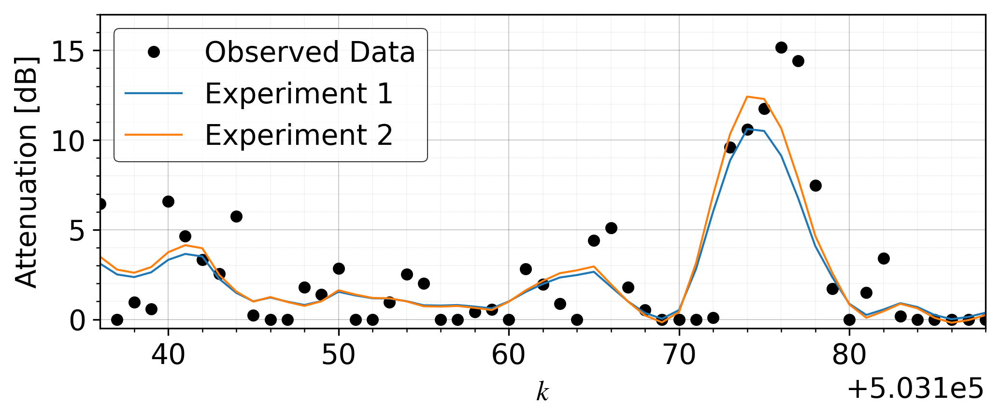

In [40]:
#Validated Dataset Total Graphics
index=9
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+30098
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['San Juan']


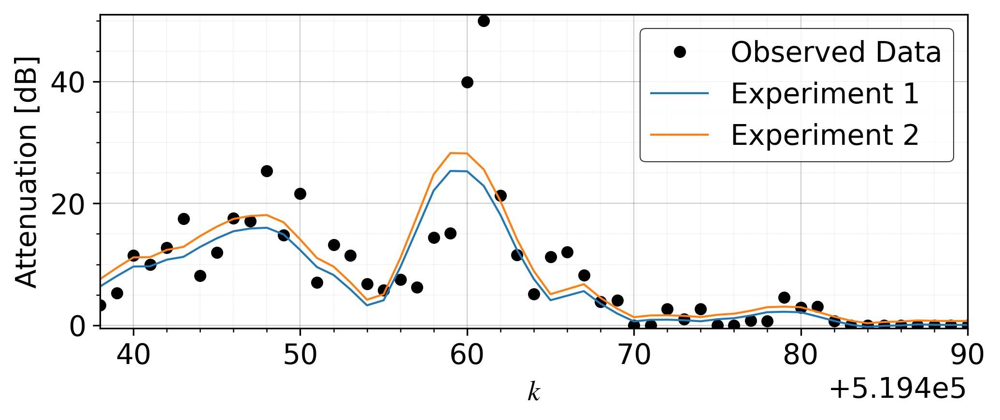

In [41]:
#Validated Dataset Total Graphics
index=10
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+46400
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Torreon']


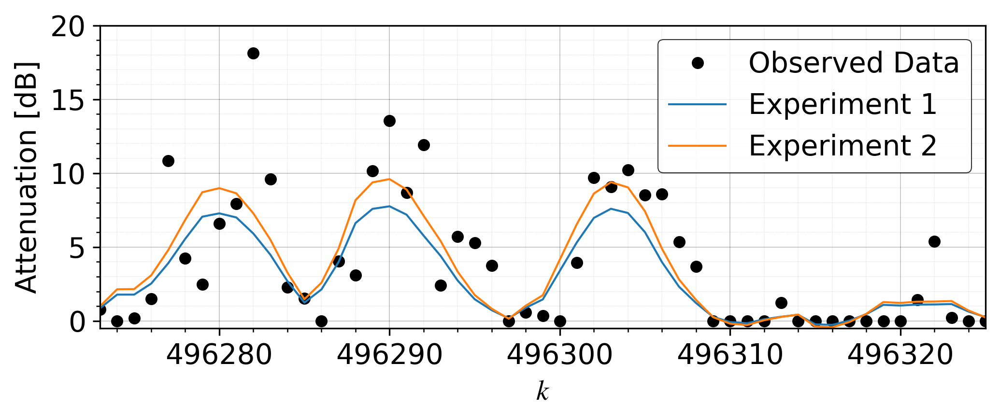

In [42]:
#Validated Dataset Total Graphics
index=11
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+23235
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['La Paz, B.C.']


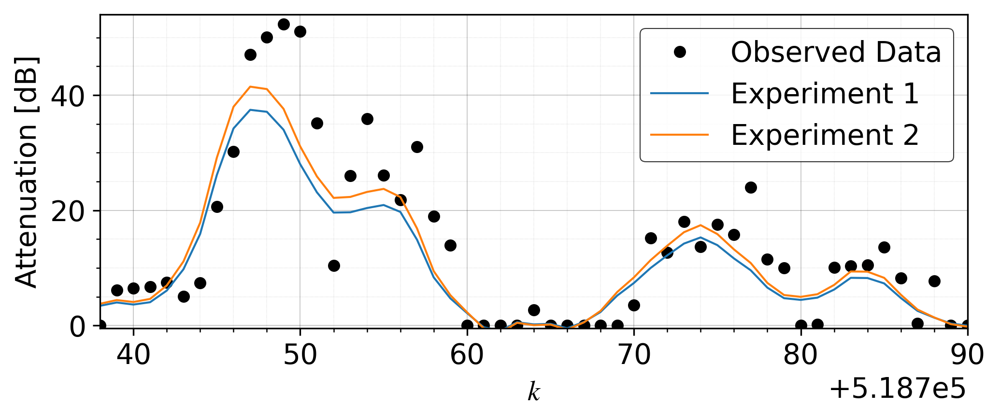

In [43]:
#Validated Dataset Total Graphics
index=12
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+45700
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Veracruz']


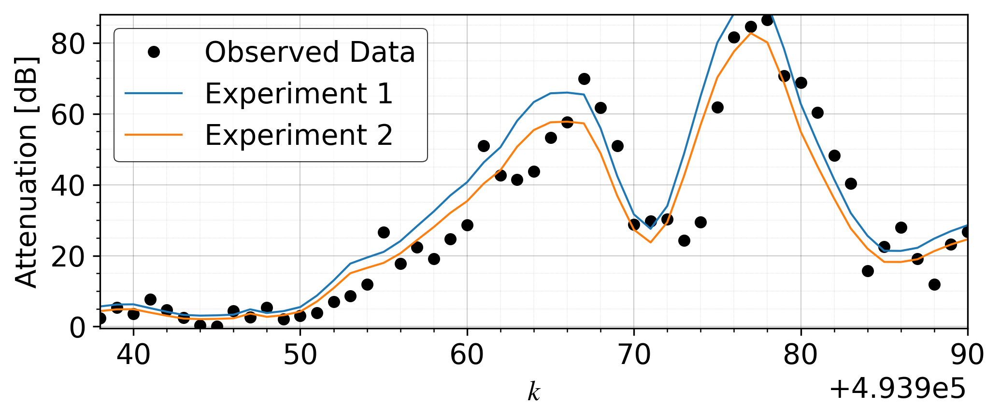

In [44]:
#Validated Dataset Total Graphics
index=13
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+20900
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Cancun']


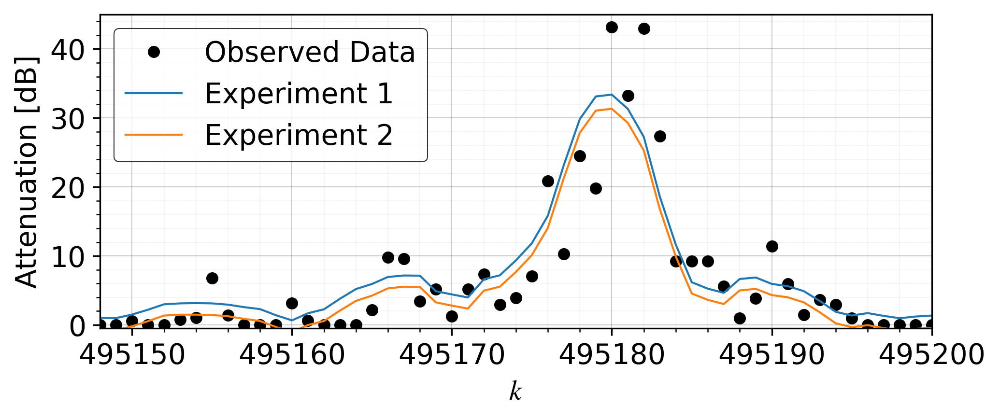

In [45]:
#Validated Dataset Total Graphics
index=14
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+22110
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Queretaro']


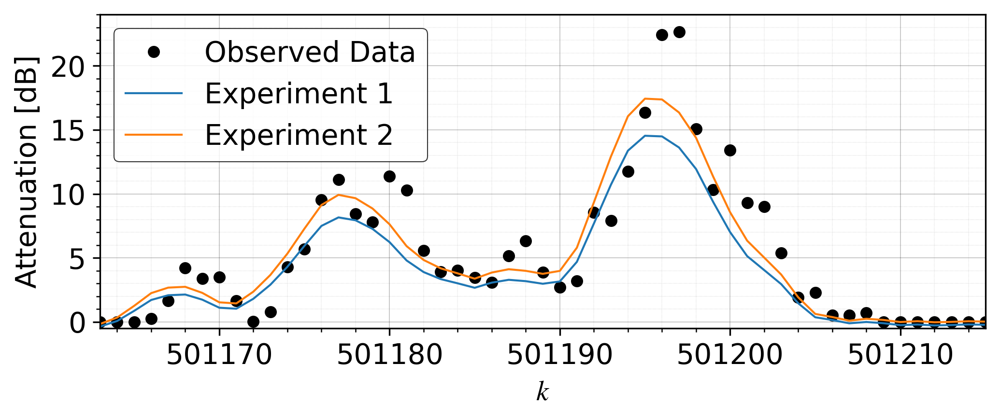

In [46]:
#Validated Dataset Total Graphics
index=16
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+28125
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Tuxtla, Gtz.']


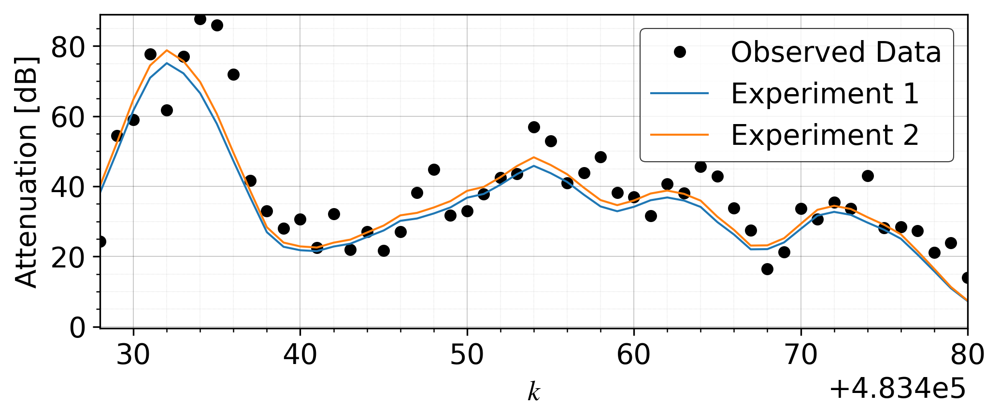

In [47]:
#Validated Dataset Total Graphics
index=17
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+10390
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Cd. Juarez']


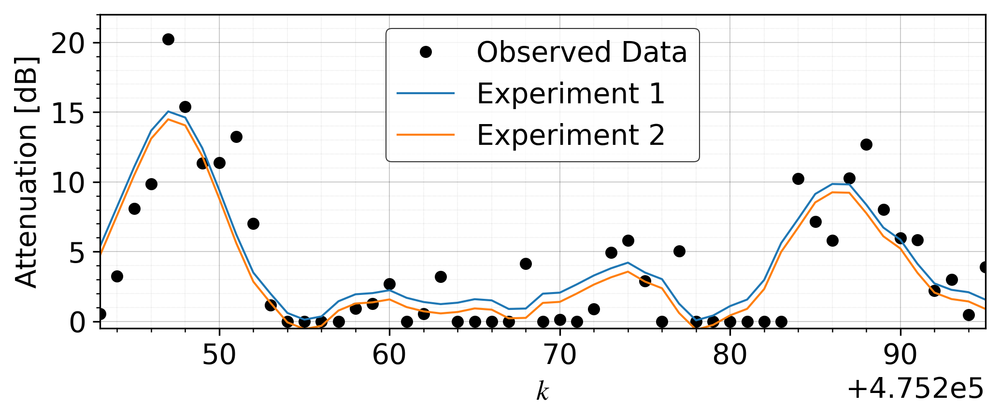

In [48]:
#Validated Dataset Total Graphics
index=18
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+2205
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['San Pedro Sula']


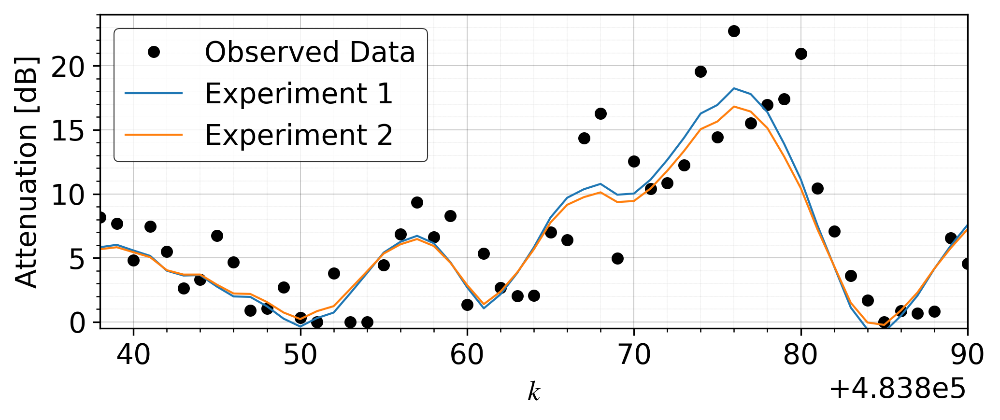

In [49]:
#Validated Dataset Total Graphics
index=19
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+10800
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Belmopan']


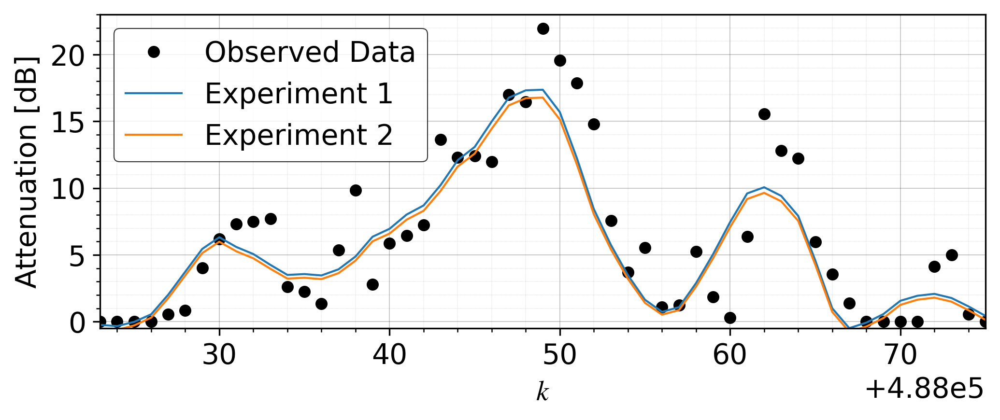

In [50]:
#Validated Dataset Total Graphics
index=20
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+14985
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Kingston']


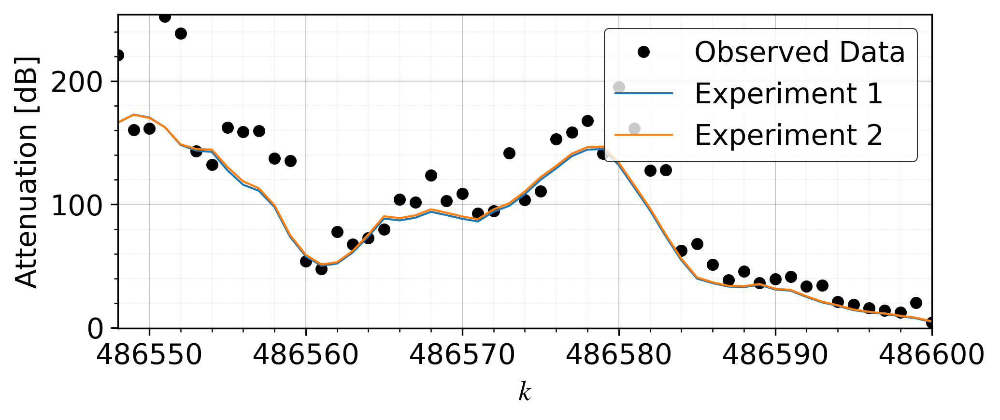

In [51]:
#Validated Dataset Total Graphics
index=21
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+13510
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Merida']


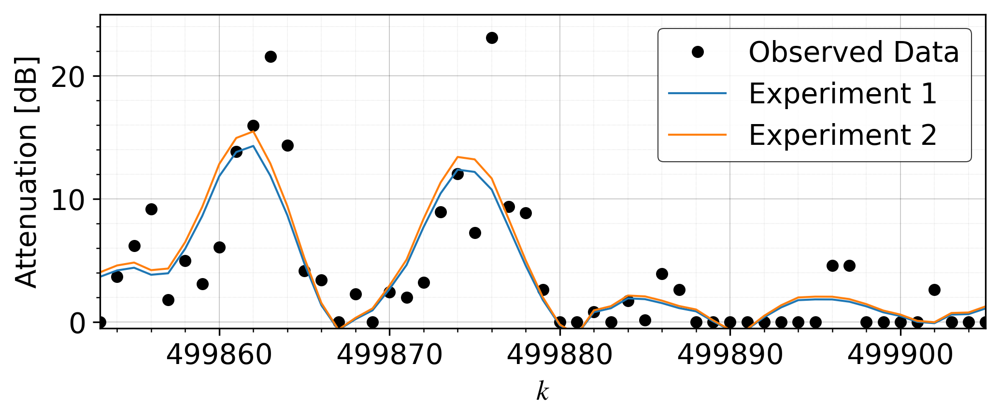

In [52]:
#Validated Dataset Total Graphics
index=22
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+26815
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Pto. Cabezas']


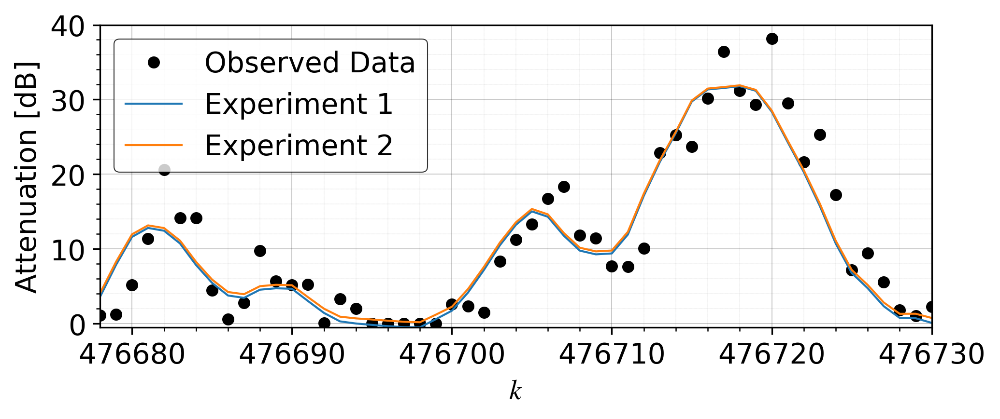

In [54]:
#Validated Dataset Total Graphics
index=23
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+3640
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()

['Oaxaca']


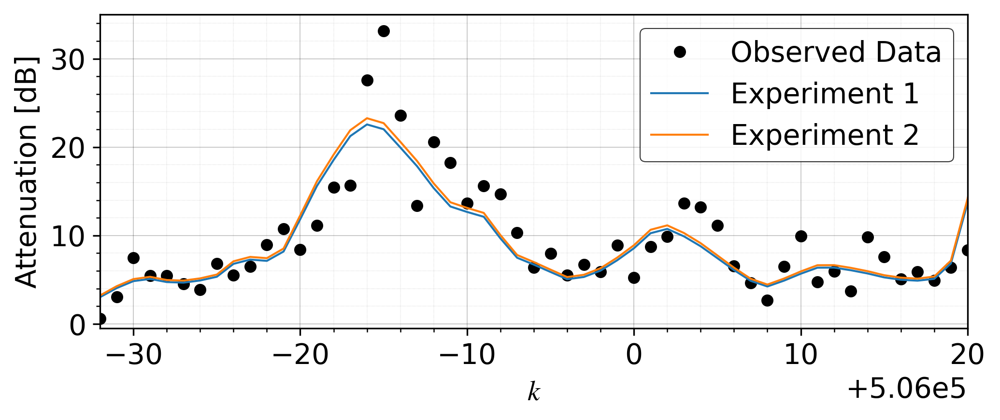

In [55]:
#Validated Dataset Total Graphics
index=24
print(locations[index])
import math
from scipy import signal
import matplotlib.font_manager as font_manager

figure(num=None, figsize=(7, 3), dpi=300, facecolor='w', edgecolor='k')
grid(color='k', linestyle=':', linewidth=.1, which='minor', alpha=0.5)
grid(color='k', linestyle='-', linewidth=.1, which='major', alpha=1)

font={'fontname':'Times','weight':'light','size':14}

k=473040
a=k+32930
b=a+50

plt.plot(Matrix_Arain[index,1:],'o',color='k',markersize=5,label='Observed Data')
plt.plot(signal.savgol_filter(Matrix_70[index,2:],15,5),'-',linewidth=1,label='Experiment 1')         
plt.plot(signal.savgol_filter(Matrix_90[index,2:],15,5),'-',linewidth=1,label='Experiment 2')        
plt.minorticks_on()

plt.axis([a, b, -0.5, math.ceil(Matrix_Arain[index,a:b].max())+1])
plt.xlim(xmin=a-2)
plt.xlim(xmax=b)
plt.xlabel('$\mathit{k}$',**font)
plt.ylabel('Attenuation [dB]',**font)
leg = plt.legend(loc='best',fontsize=14)
leg.get_frame().set_edgecolor('k')
leg.get_frame().set_linewidth(0.5)

plt.rcParams["font.family"] = "stix"
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['mathtext.it'] = 'Times:italic'
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.tight_layout()